In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib widget
import os
from nag.analytics.nag_result_model import NAGResultModel
from tools.util.package_tools import set_exec_module, get_executed_module_root_path
import nag
from tools.logger.logging import basic_config
from tools.viz.matplotlib import plot_as_image, get_mpl_figure

import torch

set_exec_module(nag)
os.chdir(get_executed_module_root_path())
basic_config()

# Working with NAGs

[Back to README](../README.md) | [Back (Reproducibility)](../docs/reproducibility.md) 

This notebook will briefly address the core features of NAGs after training. E.g. render the scene, decomposing it into individual objects or texture edit them.

Upon running experiments with NAG, results are typically stored in a structured manner within the `runs/` directory. 
Each experiment generates a unique subdirectory named based on the configuration parameters and timestamp of the run.

Contents of each experiment directory usually include:
- `training_config.yaml / init__nag_config`: The configuration file used for the experiment.
- `checkpoints/`: A directory containing model checkpoints saved at various training stages.
- `logs/`: A directory containing log files for monitoring training progress.
- `final`: The final rendered outputs, including the whole scene renderings and individual object renderings. This is further subdivided into:
  - `complete/`: Contains the complete scene renderings.
  - `[Object Name]`: Are respective directories for each object in the scene, containing their individual renderings.
  - `complete_no_view_dependence/`: Contains complete scene renderings without view-dependent effects.
- `initial`: The initial rendered outputs before training commenced and networks were optimized.
- `in_training`: Intermediate outputs saved during the training process at specified intervals.

Using the output directory, one can load the trained model, **extract rendered images**, **decompose scenes**, **texture edit** and analyze the performance of the model by **retrieving metrics**. Masking the recreation process we created the `NAGResultModel` class.

To illustrate this for a pre-trained model, you can download a sample run from the following link: [Waymo Sample Run](https://uni-siegen.sciebo.de/s/SZ6weiRfPb57kKW), and place it in the `runs/` directory. This sample run was trained on the W203 sequence of Waymo with frames from 60 to 107, using large undistorted images.
To reduce the download size, we removed intermediate checkpoints and logs, keeping only the final outputs and the training configuration.

You can also train this model yourself using [this](config\waymo\final\segment-2036908808378190283_60_107_large-undistorted.yaml) config file.

In [2]:
result_path = r"runs\2025-04-14_03-58-40_W203_60_107_large-undistorted"
rm = NAGResultModel.from_path(result_path)

This result model wraps the content of the experiment, allowing easy access to the trained model.

We can recreate the runner used for training the model as follows, it will recreate the model and load the trained weights into it. It will yield some information during the process, i.e. that it generates the objects as proxies and further loads the actual weights into it. 

>Note: Given that the objects are not actually initialized properly to save time, not all dimensions of learned fields are known. Therefor we hacked around a bit so the loading is supported even though parameters are not matching. It will trigger an information saying "Loaded model has different parameter sizes than current model..." informing of the changes. You can safely ignore it. It will further inform on missing box parameters - we are not saving boxes in the checkpoints, since they are not used for any purpose after initialization so also not cached in the state dictionary.

In [3]:
runner = rm.get_runner(preserve_output_path=True)

Seed set to 42


2025-11-29:16:20:57 INFO     Loaded box object id to mask id mapping from D:\cloud\sciebo-pbox-psfields\datasets\waymo\segment-2036908808378190283\box_id_mapping.json.               ]8;id=234053;file://D:\projects\nag-cleanup\nag\dataset\nag_dataset.py\nag_dataset.py]8;;\:]8;id=146316;file://D:\projects\nag-cleanup\nag\dataset\nag_dataset.py#153\153]8;;\

                    INFO     Creating camera...                                                                                                                                        ]8;id=91161;file://D:\projects\nag-cleanup\nag\run\nag_runner.py\nag_runner.py]8;;\:]8;id=619176;file://D:\projects\nag-cleanup\nag\run\nag_runner.py#682\682]8;;\

2025-11-29:16:20:59 INFO     Creating object No. 0, mask id 14 using name:                                                                                                             ]8;id=243962;file://D:\projects\nag-cleanup\nag\run\nag_runner.py\nag_runner.py]8;;\:]8;id=529903;file://D:\projects\nag-cleanup\nag\run\nag_runner.py#748\748]8;;\
                                     0: M-id: 14                                                                                                                                                        

2025-11-29:16:21:00 INFO     Ignored boxes 00.json, 01.json, 02.json, 04.json, 05.json, 09.json, 14.json, 23.json, 24.json, 36.json, 37.json, 38.json with ids 294, 283, 294, 18, 5,   ]8;id=681453;file://D:\projects\nag-cleanup\nag\run\nag_runner.py\nag_runner.py]8;;\:]8;id=735392;file://D:\projects\nag-cleanup\nag\run\nag_runner.py#466\466]8;;\
                             284, 7, 620, 285, 625, 626, 628 as they are not in the mask indices.                                                                                                       

                    INFO     Ignored boxes 03.json, 08.json, 10.json, 11.json, 12.json, 15.json, 17.json, 18.json, 19.json, 20.json, 22.json, 26.json, 27.json, 28.json, 29.json,      ]8;id=291704;file://D:\projects\nag-cleanup\nag\run\nag_runner.py\nag_runner.py]8;;\:]8;id=848749;file://D:\projects\nag-cleanup\nag\run\nag_runner.py#477\477]8;;\
                             30.json, 31.json, 32.json, 39.json, 40.json as they have no object id.                                                                                                     

                    INFO     Box-ID mapping: {300: 'CqTm0wIWRh6FkI-uUcVS5g', 14: 'Cz-Le17UReoLujGlvFethQ', 70: 'I7d4RRt0YQVZyyc5P8U4FQ', 298: 'QXBme6PiQSPrxDOVy1_-HA', 289:           ]8;id=732052;file://D:\projects\nag-cleanup\nag\run\nag_runner.py\nag_runner.py]8;;\:]8;id=443143;file://D:\projects\nag-cleanup\nag\run\nag_runner.py#481\481]8;;\
                             'WBxEhpvf8Xy6u8zQ7qeFjA', 280: 'kABIxGTbvyvVN5BrL6xPFA', 603: 'z2rQdxZC9t0Rc5417F0Clg', 614: 'siB6u3BqBR9mBh75LdmVwQ', 997: 'zan-QNXLtbdyJn-ZqPIk7A'}                      

                    INFO     All boxes are mapped to mask ids. 9 boxes found.                                                                                                          ]8;id=352944;file://D:\projects\nag-cleanup\nag\run\nag_runner.py\nag_runner.py]8;;\:]8;id=107175;file://D:\projects\nag-cleanup\nag\run\nag_runner.py#488\488]8;;\

                    INFO     Creating object No. 1, mask id 70 using name:                                                                                                             ]8;id=888662;file://D:\projects\nag-cleanup\nag\run\nag_runner.py\nag_runner.py]8;;\:]8;id=360663;file://D:\projects\nag-cleanup\nag\run\nag_runner.py#748\748]8;;\
                                     1: M-id: 70                                                                                                                                                        

                    INFO     Creating object No. 2, mask id 280 using name:                                                                                                            ]8;id=765179;file://D:\projects\nag-cleanup\nag\run\nag_runner.py\nag_runner.py]8;;\:]8;id=481741;file://D:\projects\nag-cleanup\nag\run\nag_runner.py#748\748]8;;\
                                     2: M-id: 280                                                                                                                                                       

                    INFO     Creating object No. 3, mask id 289 using name:                                                                                                            ]8;id=82627;file://D:\projects\nag-cleanup\nag\run\nag_runner.py\nag_runner.py]8;;\:]8;id=578856;file://D:\projects\nag-cleanup\nag\run\nag_runner.py#748\748]8;;\
                                     3: M-id: 289                                                                                                                                                       

                    INFO     Creating object No. 4, mask id 298 using name:                                                                                                            ]8;id=928463;file://D:\projects\nag-cleanup\nag\run\nag_runner.py\nag_runner.py]8;;\:]8;id=903565;file://D:\projects\nag-cleanup\nag\run\nag_runner.py#748\748]8;;\
                                     4: M-id: 298                                                                                                                                                       

                    INFO     Creating object No. 5, mask id 300 using name:                                                                                                            ]8;id=72933;file://D:\projects\nag-cleanup\nag\run\nag_runner.py\nag_runner.py]8;;\:]8;id=48050;file://D:\projects\nag-cleanup\nag\run\nag_runner.py#748\748]8;;\
                                     5: M-id: 300                                                                                                                                                       

                    INFO     Creating object No. 6, mask id 603 using name:                                                                                                            ]8;id=83667;file://D:\projects\nag-cleanup\nag\run\nag_runner.py\nag_runner.py]8;;\:]8;id=896865;file://D:\projects\nag-cleanup\nag\run\nag_runner.py#748\748]8;;\
                                     6: M-id: 603                                                                                                                                                       

                    INFO     Creating object No. 7, mask id 614 using name:                                                                                                            ]8;id=291476;file://D:\projects\nag-cleanup\nag\run\nag_runner.py\nag_runner.py]8;;\:]8;id=475435;file://D:\projects\nag-cleanup\nag\run\nag_runner.py#748\748]8;;\
                                     7: M-id: 614                                                                                                                                                       

                    INFO     Creating object No. 8, mask id 997 using name:                                                                                                            ]8;id=388162;file://D:\projects\nag-cleanup\nag\run\nag_runner.py\nag_runner.py]8;;\:]8;id=372528;file://D:\projects\nag-cleanup\nag\run\nag_runner.py#748\748]8;;\
                                     8: M-id: 997                                                                                                                                                       

                    INFO     Creating background...                                                                                                                                    ]8;id=716751;file://D:\projects\nag-cleanup\nag\run\nag_runner.py\nag_runner.py]8;;\:]8;id=679514;file://D:\projects\nag-cleanup\nag\run\nag_runner.py#782\782]8;;\

2025-11-29:16:21:04 INFO     Color resolution on Background set to default. Using resolution 1080 x 1620 (H x W).                                            ]8;id=256702;file://D:\projects\nag-cleanup\nag\model\background_image_plane_scene_node_3d.py\background_image_plane_scene_node_3d.py]8;;\:]8;id=171339;file://D:\projects\nag-cleanup\nag\model\background_image_plane_scene_node_3d.py#937\937]8;;\

2025-11-29:16:21:05 INFO     Loaded model has different parameter sizes than current model. The following parameters have been changed:                                                ]8;id=584004;file://D:\projects\nag-cleanup\nag\model\nag_model.py\nag_model.py]8;;\:]8;id=230283;file://D:\projects\nag-cleanup\nag\model\nag_model.py#1308\1308]8;;\
                             _interpolated_steps: [0] -> [20],                                                                                                                                          
                             _right_idx: [0] -> [20, 2],                                                                                                                                                
                             _rel_frac: [0] -> [1, 20],                                                                                                                                                 
                             _right_idx_offset: [0] -> [20, 2],                                                                                                                                         
                             _rel_frac_offset: [0] -> [1, 20],                                                                                                                                          
                             _world._scene_children.2.initial_alpha: [1, 1, 1] -> [1, 247, 616],                                                                                                        
                             _world._scene_children.2.initial_rgb: [3, 1, 1] -> [3, 247, 616],                                                                                                          
                             _world._scene_children.2.rgb_normalization.old_mean: [1] -> [1, 3],                                                                                                        
                             _world._scene_children.2.rgb_normalization.old_std: [1] -> [1, 3],                                                                                                         
                             _world._scene_children.2.alpha_normalization.old_mean: [1] -> [1, 1],                                                                                                      
                             _world._scene_children.2.alpha_normalization.old_std: [1] -> [1, 1],                                                                                                       
                             _world._scene_children.2.flow_normalization.old_mean: [1] -> [1, 7, 2],                                                                                                    
                             _world._scene_children.2.flow_normalization.old_std: [1] -> [1, 7, 2],                                                                                                     
                             _world._scene_children.2.view_dependence_normalization.old_mean: [1] -> [1, 4],                                                                                            
                             _world._scene_children.2.view_dependence_normalization.old_std: [1] -> [1, 4],                                                                                             
                             _world._scene_children.3.initial_alpha: [1, 1, 1] -> [1, 443, 238],                                                                                                        
                             _world._scene_children.3.initial_rgb: [3, 1, 1] -> [3, 443, 238],                                                                                                          
                             _world._scene_children.3.rgb_normalization.old_mean: [1] -> [1, 3],                                                                                                        
                        

                    INFO     Loaded model is missing parameters. The following parameters have been added:                                                                             ]8;id=58655;file://D:\projects\nag-cleanup\nag\model\nag_model.py\nag_model.py]8;;\:]8;id=240174;file://D:\projects\nag-cleanup\nag\model\nag_model.py#1312\1312]8;;\
                             _node_indices: [11],                                                                                                                                                       
                             _world._scene_children.2.box.size: [3],                                                                                                                                    
                             _world._scene_children.3.box.size: [3],                                                                                                                                    
                             _world._scene_children.4.box.size: [3],                                                                                                                                    
                             _world._scene_children.5.box.size: [3],                                                                                                                                    
                             _world._scene_children.6.box.size: [3],                                                                                                                                    
                             _world._scene_children.7.box.size: [3],                                                                                                                                    
                             _world._scene_children.8.box.size: [3],                                                                                                                                    
                             _world._scene_children.9.box.size: [3],                                                                                                                                    
                             _world._scene_children.10.box.size: [3]                                                                                                                                    

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


## Rendering the Scene

Using the runner and the core `NAGFunctionalModel`, allows us to render the scene - as trainined by the model.


In [4]:
t = runner.dataset.frame_timestamps
selected_timestamp = t[0:13:4]
actual_frame_indices = runner.dataset.times_to_frame_indices(selected_timestamp)

output = runner.model.query(selected_timestamp)
images = list(output)

Generating Image: 100%|##########| 1/1 [00:02<00:00,  2.59s/it]

`.query` returns a SizedGenerator of images (a generator with a known length), which we can convert to a list for easier handling and visualization. Here, we query the model at selected timestamps and visualize the rendered images. If you want to have images for timestamps directly, you may want to look into the `generate_outputs` method, yielding image tensors.

Further, we plot these images. Whenever, we query the NAG, we need to define the timestamps to evaluate on. The time $t \in [0, 1]$ represents the time of scene frames during training. Within our `NAGDataset`, we provide conversion methods between them.


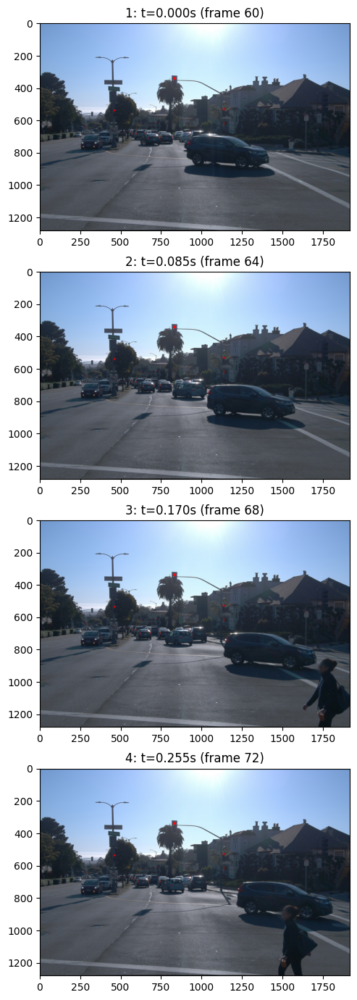

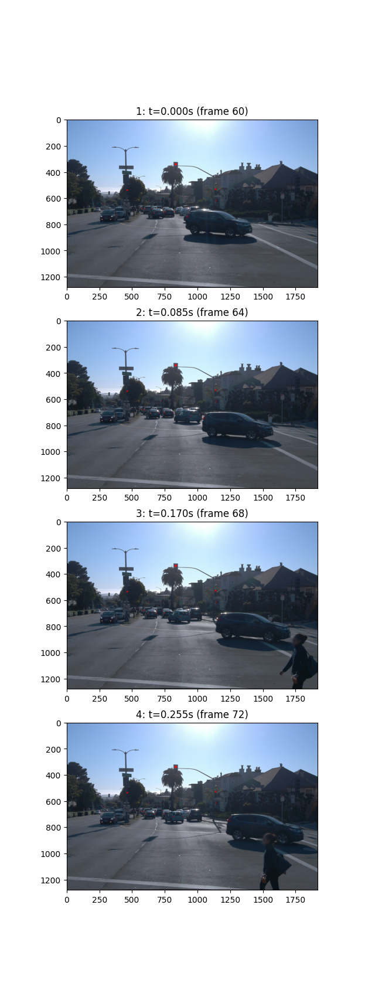

In [5]:
stacked_images = torch.cat(images, dim=0)
names = [f"t={ts:.3f}s (frame {fi})" for ts, fi in zip(selected_timestamp, actual_frame_indices)]
plot_as_image(stacked_images, variable_name=names, native_size=True)

## Rendering a Partial Scene - Scene Decomposition

To decompose the scene into its objects, we can render them individually, or in different combinations.

### Representing and identifying individual objects

For decomposing the scenes we want to briefly introduce and explain how we represent objects and how to identify them within the model. The `NAGFunctionalModel` contains a list of `objects` representing all nodes in it.
The objects have a name, we set the name during creating of our `world` by the given index and Mask index.


These objects are defined in a certain order, which aligns with inner representations of positions and other properties, so direct modifications are not recommended.

In [6]:
runner.model.objects

[ViewDependentImagePlaneSceneNode3D(name=0: M-id: 14),
 ViewDependentImagePlaneSceneNode3D(name=1: M-id: 70),
 ViewDependentImagePlaneSceneNode3D(name=2: M-id: 280),
 ViewDependentImagePlaneSceneNode3D(name=3: M-id: 289),
 ViewDependentImagePlaneSceneNode3D(name=4: M-id: 298),
 ViewDependentImagePlaneSceneNode3D(name=5: M-id: 300),
 ViewDependentImagePlaneSceneNode3D(name=6: M-id: 603),
 ViewDependentImagePlaneSceneNode3D(name=7: M-id: 614),
 ViewDependentImagePlaneSceneNode3D(name=8: M-id: 997),
 ViewDependentBackgroundImagePlaneSceneNode3D(name=Background Plane 9)]

#### Learned Representations in 3D

To get a better feeling of what they represent, we implemented some simplistic 3D plotting in matplotlib.
The model actually contains a `world` object, which is the root node for the Scene Graph and contains its children. 
Associated with each node is a plotting function, `plot_object`. To plot also the children / the graph, one invokes `plot_scene`, which handles this automatically. It will forward every argument passed to the `plot_scene` to the `plot_object` of every node which may trigger some behavior. Yet, not every argument is documented as of now, so you would need to investigate a bit on whats possible.

> Notes: While a direct Scene Graph structure for visualization and handling is straightforward, it has some caveats for training. Originally, we implemented a NAGModel - a implementation purely relying on the scene graph. Yet, this is impractical for training as it hinders parallelism for calculation of ray-intersections as well as position learning. Therefore the subclass NAGFunctionalModel externalizes positions and other learnable properties in a combined representation and propagates views of the variables to the objects. This allows to train and evaluate faster, keep the scene graph structure for visualization, yet requires some logic to make these representations consistent and currently limits to flat hierarchies of objects.


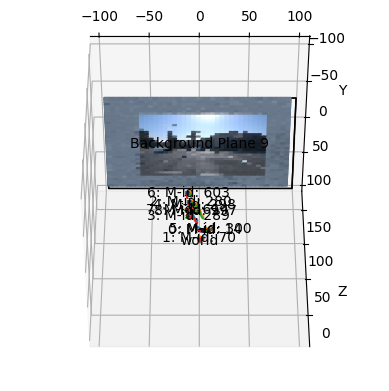

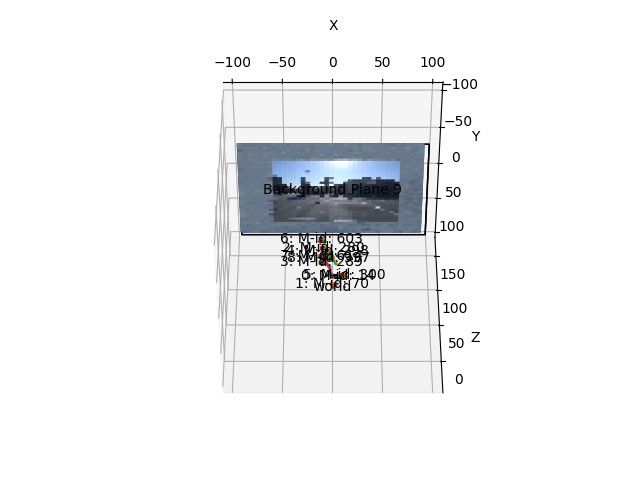

In [7]:
# Lets now visualize this scene
t=0.5 # Timestep to plot the model on.
runner.model.plot_scene(t=t, size=7, 
                        plot_plane_image=True, # Renders color on the planes
                        plot_plane_alpha=True, # Renders the alpha, making transparent regions visible
                        plot_ray_cast=False, # Enables ray casts of the camera, highlighting field of view.
                        ray_distance=50, # Distance of camera rays.
                        plot_plane_traces=True,  # Renders the plane traces
                        plot_camera_traces=True # Renders the camera traces
                        )

# We render a simplistic low-resolution version of the fields to the objects and some traces to visualize the motion of the planes along time.

#### Learned Representations in 2D

While 3D representations are expressive and reveal occlusions, they might be hard to navigate.
So we also implemented a projection for all objects to 2D to visualize them, by projection the plane corners to image space.

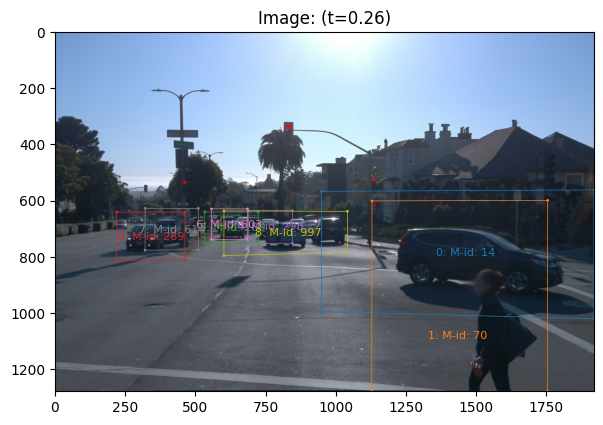

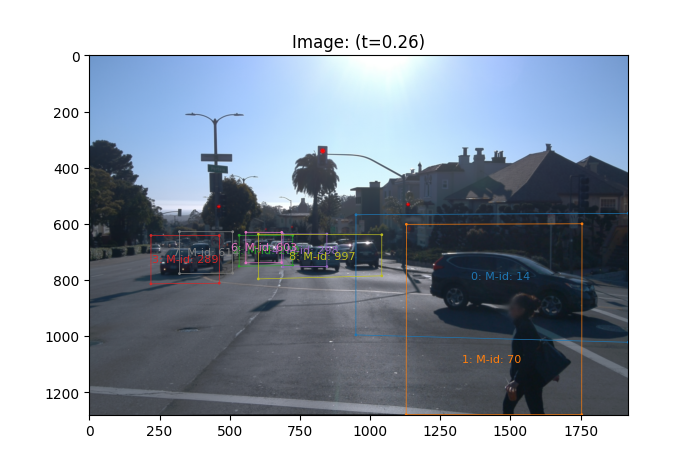

In [8]:
from nag.model.background_image_plane_scene_node_3d import BackgroundImagePlaneSceneNode3D
from nag.model.view_dependent_image_plane_scene_node_3d import ViewDependentImagePlaneSceneNode3D

cimg = images[-1]
sel_time = selected_timestamp[-1]    
sel_actual_time = actual_frame_indices[-1]

fig = plot_as_image(cimg, variable_name=f"Image: (t={sel_time:.2f})", size=7)
ax = fig.axes[0]


camera = runner.model.camera
for obj in runner.model.objects:
    obj: ViewDependentImagePlaneSceneNode3D
    if isinstance(obj, BackgroundImagePlaneSceneNode3D):
        continue
    # Projects the plane corners to image space.
    obj.plot_2d_projection(camera, ax=ax, t=sel_time)
display(fig)

#### Ground Truth Representations

Further we can use also our ground truth data to identify objects. Here, we plot the ground truth for corresponding item in the dataset.


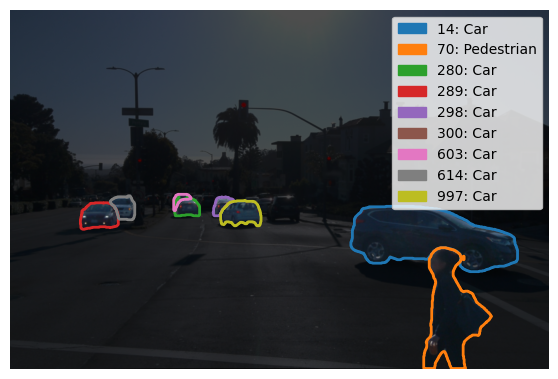

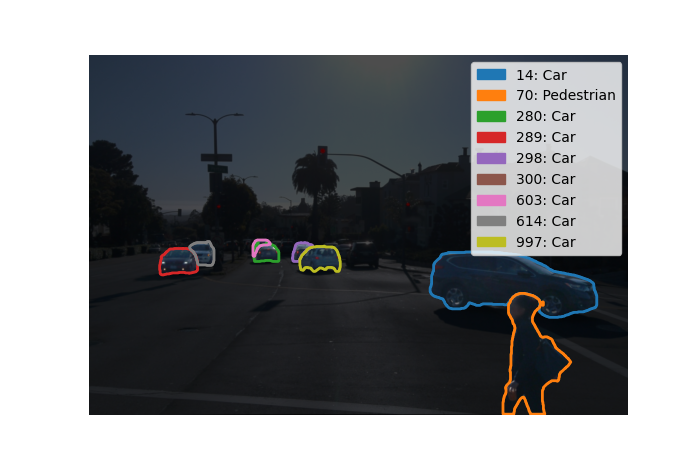

In [9]:
dataset = runner.dataset
dataset.plot_gt_item(dataset.times_to_indices(sel_time), size=7)

### Rendering Objects

If we now want to render the person, as well as the car with index 14 seperately, we can simply get their object, and provide it to the rendering function.

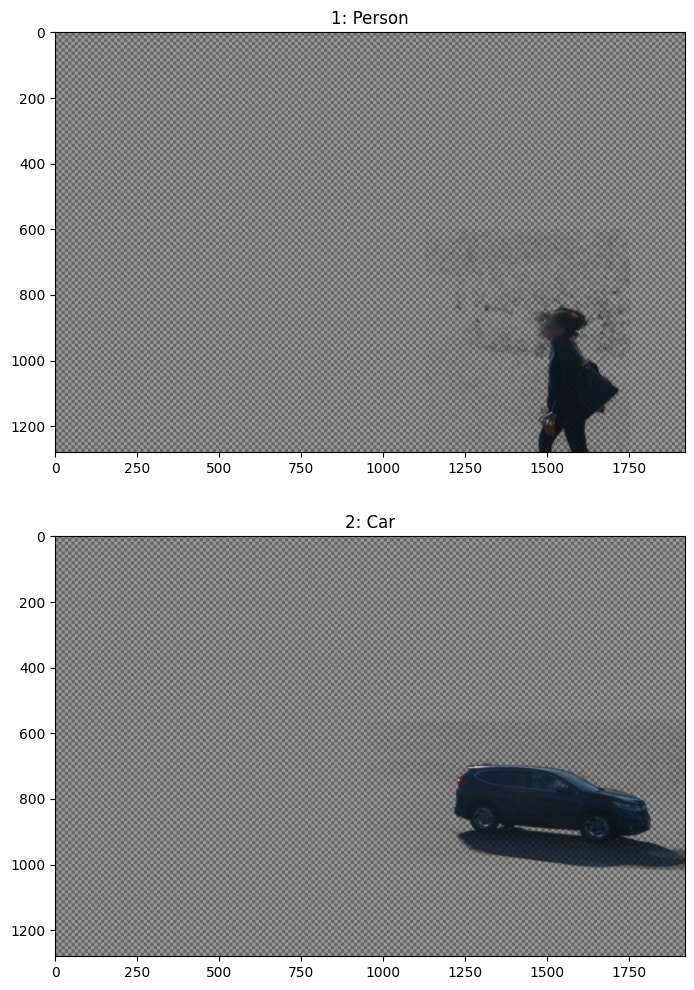

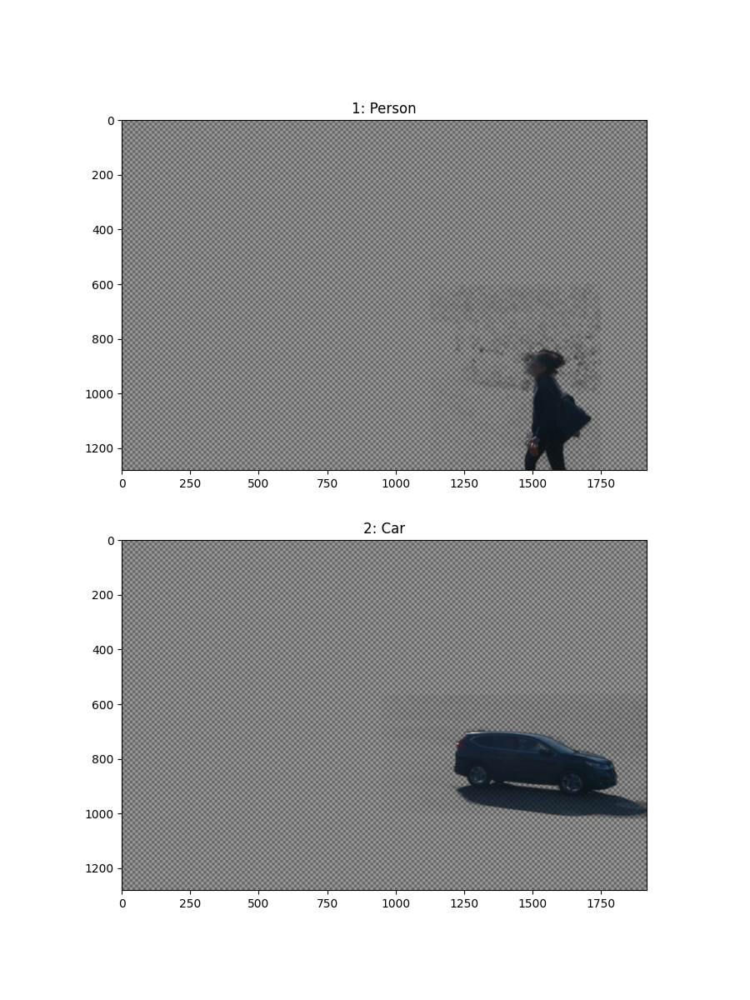

In [10]:
person_obj = next((x for x in runner.model.objects if x.get_name() == "1: M-id: 70"))
car_obj = next((x for x in runner.model.objects if x.get_name() == "0: M-id: 14"))

t = sel_time
outputs = runner.model.generate_outputs(runner.model.config, t=t, objects=[[person_obj], [car_obj]]) # N, T, C, H, W
plot_as_image(outputs[:, 0], variable_name=["Person", "Car"], size=9)

Further we can also render all objects without the "person" and "car"

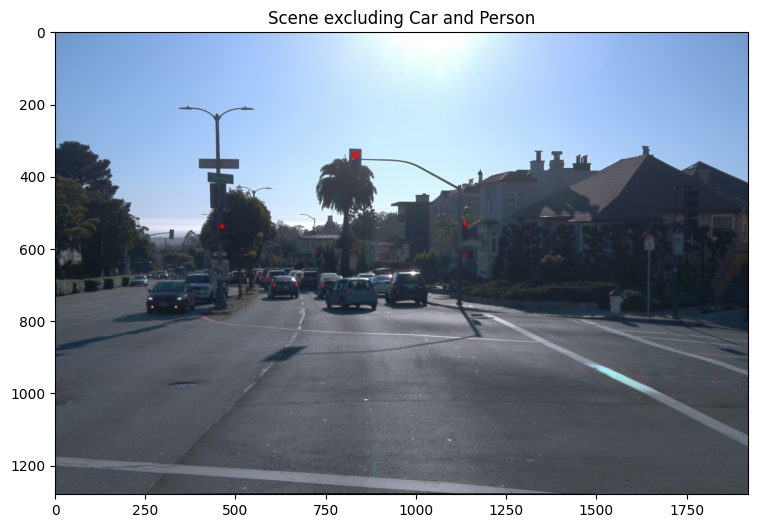

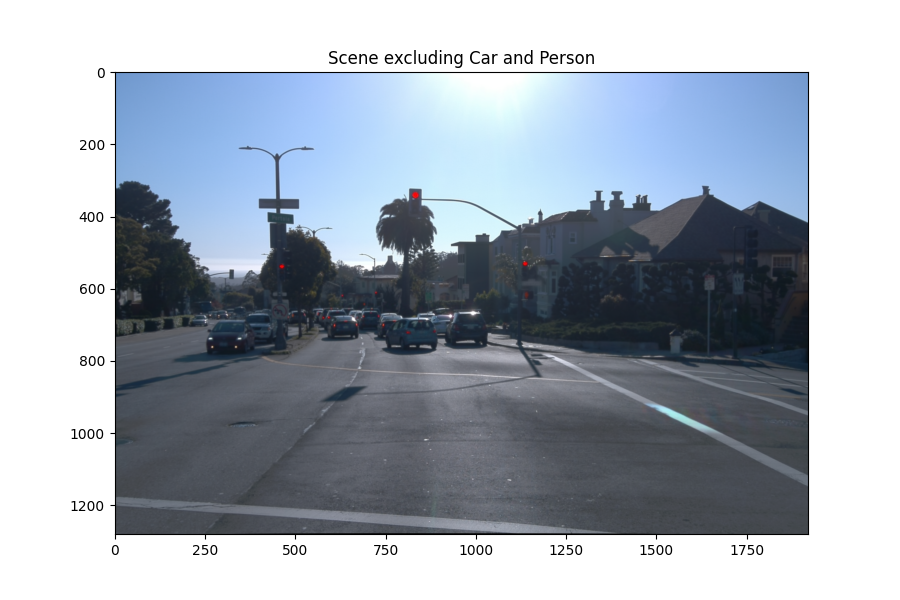

In [11]:
selected_objects = [x for x in runner.model.objects if x not in [person_obj, car_obj]]
outputs = runner.model.generate_outputs(runner.model.config, t=t, objects=selected_objects) # T, C, H, W
plot_as_image(outputs, variable_name="Scene excluding Car and Person", size=9)

In [12]:
outputs.shape

torch.Size([1, 4, 1280, 1920])

## Rendering Texture Edits


To render textures on the NAG, each object implements the function of `TextureMappableSceneNode3D` class, which is responsible for creating textures in atlas space and making them available during rendering ìn the `compute_rgb_alpha` methods via `get_rendered_texture_map`.

Our process of creating textures is:

 1. Take a rendered image of one timestamp `t` (rendered as before, or using GT data)
 2. Use the image "as template" in an image editor / query a Image generation model with a decomposed or full image
 3. Use the `create_texture_map` function for an object at time `t` to project the texture
 4. Render it using normal querying.

Let's skip 1 and 2 for know, since we provide two textures in the `texture` folder of the provided run.

In [13]:
from tools.transforms.to_tensor_image import ToTensorImage
from tools.io.image import load_image, save_image

speed_sign = runner.config.output_path / "textures" / "speed_limit_zebra.png"
stop_sign = runner.config.output_path / "textures" / "stop_sign_zebra.png"

# Textures are on the background so select the
background = runner.model.objects[-1]
target_t = runner.dataset.frame_timestamps[16] # Time which was used as reference image
to_tensor_image = ToTensorImage(output_dtype=torch.float32)
texture = to_tensor_image(load_image(speed_sign))


# Our texture map is created using the create_texture_map function.
# Since the texture is projected on the plane and defined in image space, only parts of the texture image are considered which are projectable to the plane

runner.model.background.create_texture_map(texture, t=target_t[None], camera=runner.model.camera) # This might take a bit since we are inverting the flow

Now we can render the scene as usual, but need to enable the texture edit using `render_texture_map`. 
Since foreground and background objects implementing both the `TextureMappableSceneNode3D` class, you can use it on the foreground objects in the same way.

In [14]:
from tools.video.inpaint_writer import InpaintWriter
from tools.transforms.to_numpy_image import ToNumpyImage
import numpy as np

base_path = os.path.join(runner.config.output_path, "edits", "texture-stop-sign-zebra")
retimed_video_path = os.path.join(base_path, "texture.mp4")
numpyify_image = ToNumpyImage(output_dtype=np.uint8)

start = 0
end = None

times = runner.dataset.frame_timestamps[start:end]
if not os.path.exists(base_path):
    os.makedirs(base_path)
if not os.path.exists(os.path.dirname(retimed_video_path)):
    os.makedirs(os.path.dirname(retimed_video_path))

start = 0
ignore_oids = [runner.dataset.mask_id_to_oid(x) for x in [70, 997]] # Lets ignore also the person and one car here to better see the texture
objects = [x for x in runner.model.objects if x.get_index() not in ignore_oids]


Lets render it for the full video:

In [15]:

runner.model.background.render_texture_map = True # Activate the texture for the object
gen = runner.model.query(t=times, objects=objects) # Then we can use the default query function to render it.
with InpaintWriter(retimed_video_path, fps=10, inpaint_counter=False) as writer:
    for i, t in enumerate(times):
        image = next(gen)
        # Lets save the images, and create the video at the same time.
        save_image(numpyify_image(image), os.path.join(base_path, f"{start + i:03d}_t.png"))
        writer.write(image)

To compare the frames, lets consider the default version:

In [16]:

runner.model.background.render_texture_map = True # Activate the texture for the object
sel_t = times[:-16:8]
textured_images = list(runner.model.query(t=sel_t, objects=objects))

runner.model.background.render_texture_map = False # Deactivate for comparison
full_render = list(runner.model.query(t=sel_t)) # Render everything


And render them side by side:

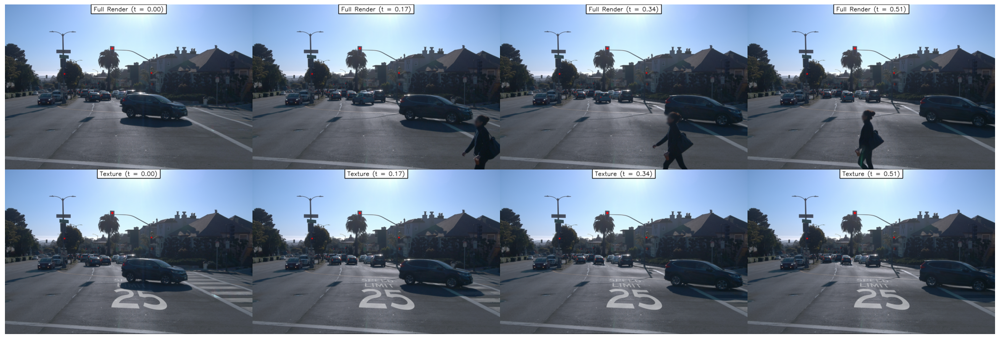

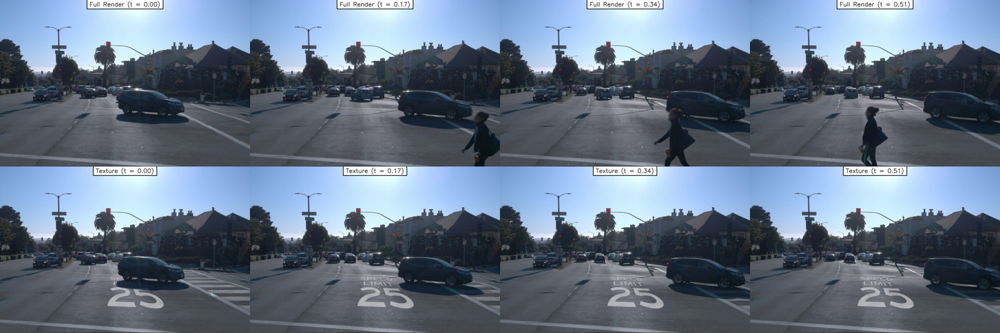

In [17]:
rows = 2
cols = len(sel_t)

fig, axes = get_mpl_figure(rows, cols, ratio_or_img=textured_images[0], size=5, tight=True, ax_mode="2d")

for col in range(cols):
    plot_as_image(full_render[col], axes=axes[0, col], inpaint_title=True, variable_name=f"Full Render (t = {sel_t[col]:.2f})")
    plot_as_image(textured_images[col], axes=axes[1, col], inpaint_title=True, variable_name=f"Texture (t = {sel_t[col]:.2f})")

fig


## Retrieving Metrics


During training, we are storing multiple metrics which are stored in our `Tracker` class. This tracker is saved to the runs folder and can be accessed also with the result model, or recreated runner instance.

In [18]:
tracker = rm.get_tracker(-1) # Index if multiple are save
tracker = runner.tracker

The tracker caches these metrics in dataframes, based on tags in a `metrics` dictionary.
Besides metrics like PSNR, SSIM, LPIPS, we are further tracking object positions as well as metrics evaluated on masked areas.

In [19]:
list(tracker.metrics.keys())

['train/epoch/0: M-id: 14_quat',
 'train/epoch/0: M-id: 14_trans',
 'train/epoch/1: M-id: 70_quat',
 'train/epoch/1: M-id: 70_trans',
 'train/epoch/2: M-id: 280_quat',
 'train/epoch/2: M-id: 280_trans',
 'train/epoch/3: M-id: 289_quat',
 'train/epoch/3: M-id: 289_trans',
 'train/epoch/4: M-id: 298_quat',
 'train/epoch/4: M-id: 298_trans',
 'train/epoch/5: M-id: 300_quat',
 'train/epoch/5: M-id: 300_trans',
 'train/epoch/6: M-id: 603_quat',
 'train/epoch/6: M-id: 603_trans',
 'train/epoch/7: M-id: 614_quat',
 'train/epoch/7: M-id: 614_trans',
 'train/epoch/8: M-id: 997_quat',
 'train/epoch/8: M-id: 997_trans',
 'train/epoch/camera_quat',
 'train/epoch/camera_trans',
 'train/epoch/Background Plane 9_quat',
 'train/epoch/Background Plane 9_trans',
 'train/epoch/MeanMPSNR',
 'train/epoch/MPSNR',
 'train/epoch/MeanSSIM',
 'train/epoch/SSIM',
 'train/epoch/MeanLPIPS',
 'train/epoch/LPIPS',
 'train/epoch/Mean_Mask_14_MPSNR',
 'train/epoch/Mask_14_MPSNR',
 'train/epoch/Mean_Mask_70_MPSNR',
 't

The corresponding dataframes can be accessed via the equivalent tag. E.g. for the PSNR it would be `train/epoch/MPSNR`
having the PSNR values for each frame, while `train/epoch/MeanMPSNR` the mean PSNR on all frames. Step referes here to the epoch.

In [21]:
display(tracker.metrics["train/epoch/MPSNR"].values)
display(tracker.metrics["train/epoch/MeanMPSNR"].values)

,value,global_step
step,,
80,"[42.680855, 42.80465, 43.035603, 42.938675, 43...",80


,value,global_step
step,,
80,42.556267,80
